In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip available: 22.3.1 -> 23.0
[notice] To update, run: pip install --upgrade pip


In [28]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

In [35]:
adata1168 = sc.read_10x_mtx(r'/mnt/c/Users/Emil/10X/1168', cache = True)

... writing an h5ad cache file to speedup reading next time


In [37]:
adata1167 = sc.read_10x_mtx('/mnt/c/Users/Emil/10X/1167', cache = True)

... writing an h5ad cache file to speedup reading next time


In [38]:
adata1168.obs['stage'] = '1168'
adata1167.obs['stage'] = '1167'

In [39]:
adataall = AnnData.concatenate(adata1168, adata1167)

In [40]:
adataall


AnnData object with n_obs × n_vars = 4790 × 32285
    obs: 'stage', 'batch'
    var: 'gene_ids', 'feature_types'

In [41]:
adata1168

AnnData object with n_obs × n_vars = 3569 × 32285
    obs: 'stage'
    var: 'gene_ids', 'feature_types'

In [42]:
adata1167

AnnData object with n_obs × n_vars = 1221 × 32285
    obs: 'stage'
    var: 'gene_ids', 'feature_types'

In [43]:
adataall.obs_names_make_unique()

In [44]:
sc.pp.filter_genes(adataall,min_cells=3)
sc.pp.normalize_total(adataall)
sc.pp.log1p(adataall,base=10)
sc.pp.highly_variable_genes(adataall)

filtered out 13957 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [45]:
sc.pp.pca(adataall)
pca_projections = pd.DataFrame(adataall.obsm["X_pca"],index=adataall.obs_names)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


In [46]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)


In [47]:
# generate neighbor draph in multiscale diffusion space
adataall.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adataall,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [48]:
adataall.obsm["X_pca2d"]=adataall.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adataall,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:28)


In [49]:
sc.tl.leiden(adataall)

running Leiden clustering
    finished: found 35 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


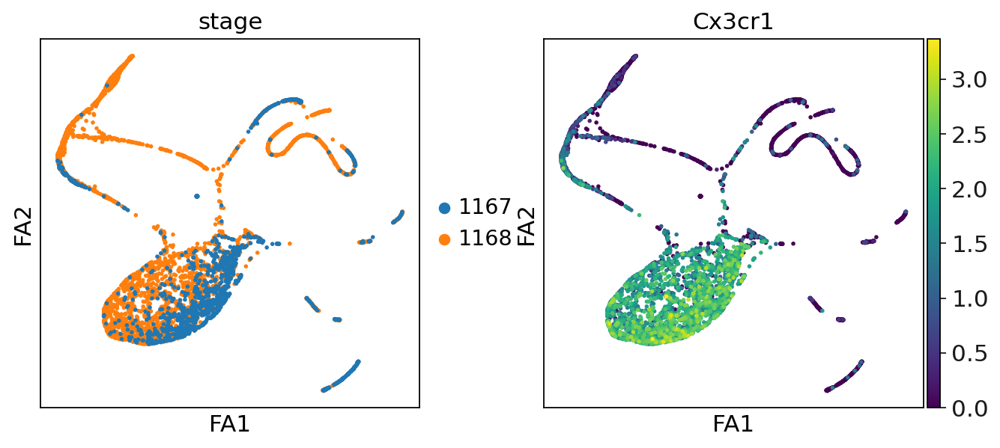

In [53]:
sc.set_figure_params()
sc.pl.draw_graph(adataall,color=["stage",'Cx3cr1']) #PCA-based, n_neighbors = 50, n_eigs = 4

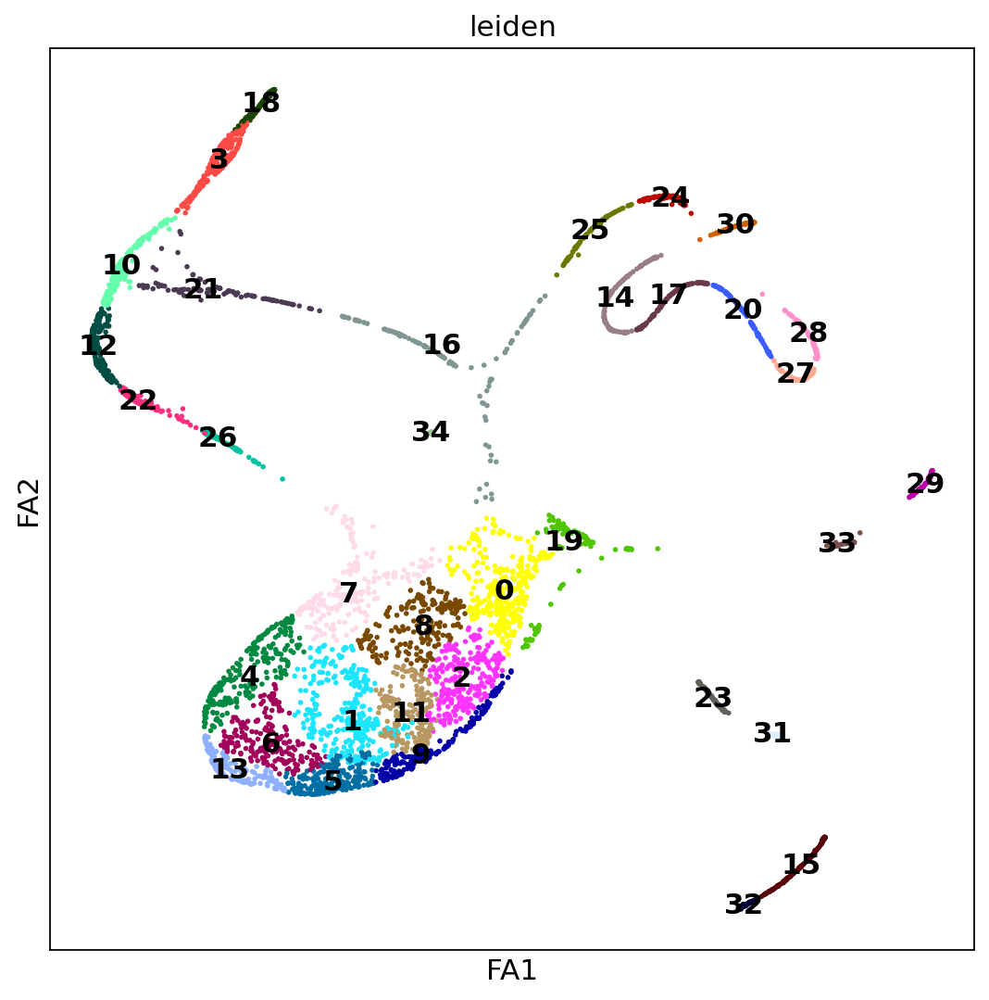

In [58]:
sc.set_figure_params(figsize = (8,8))
sc.pl.draw_graph(adataall,color=["leiden"], legend_loc = 'on data')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:01)


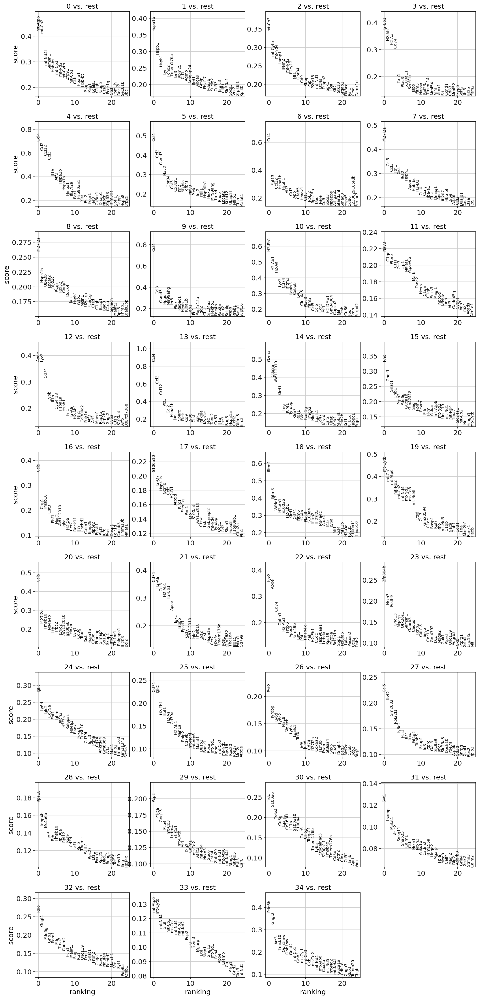

In [60]:
sc.set_figure_params()
sc.tl.rank_genes_groups(adataall, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adataall, n_genes=25, sharey=False)

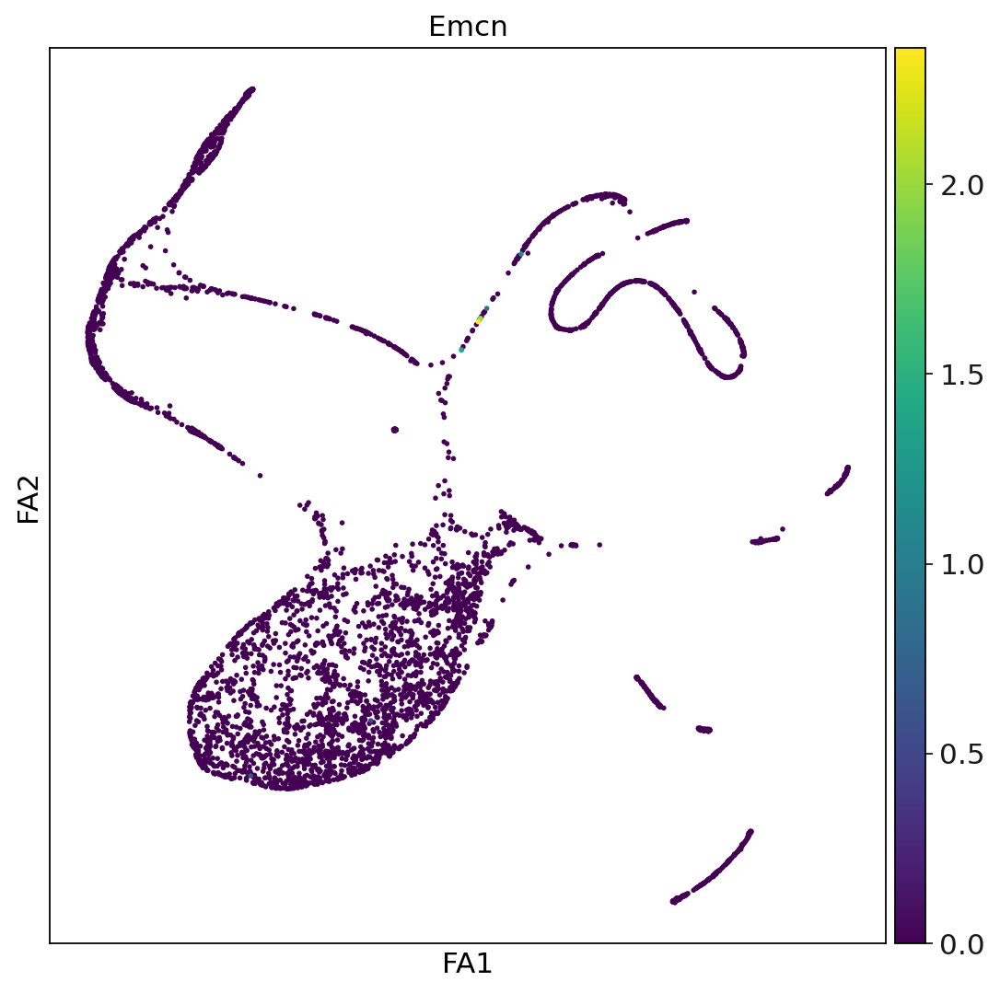

In [64]:
sc.set_figure_params(figsize = (8,8))
sc.pl.draw_graph(adataall,color=["Emcn",'Pdgfrb'], legend_loc = 'on data') #endotheliocytes, podocytes

In [66]:
adataallsubset = adataall[adataall.obs['leiden'].isin(['18','3','10','21','12','22','26','7','0','8','2','11','1','9','5','4','6','13'])]

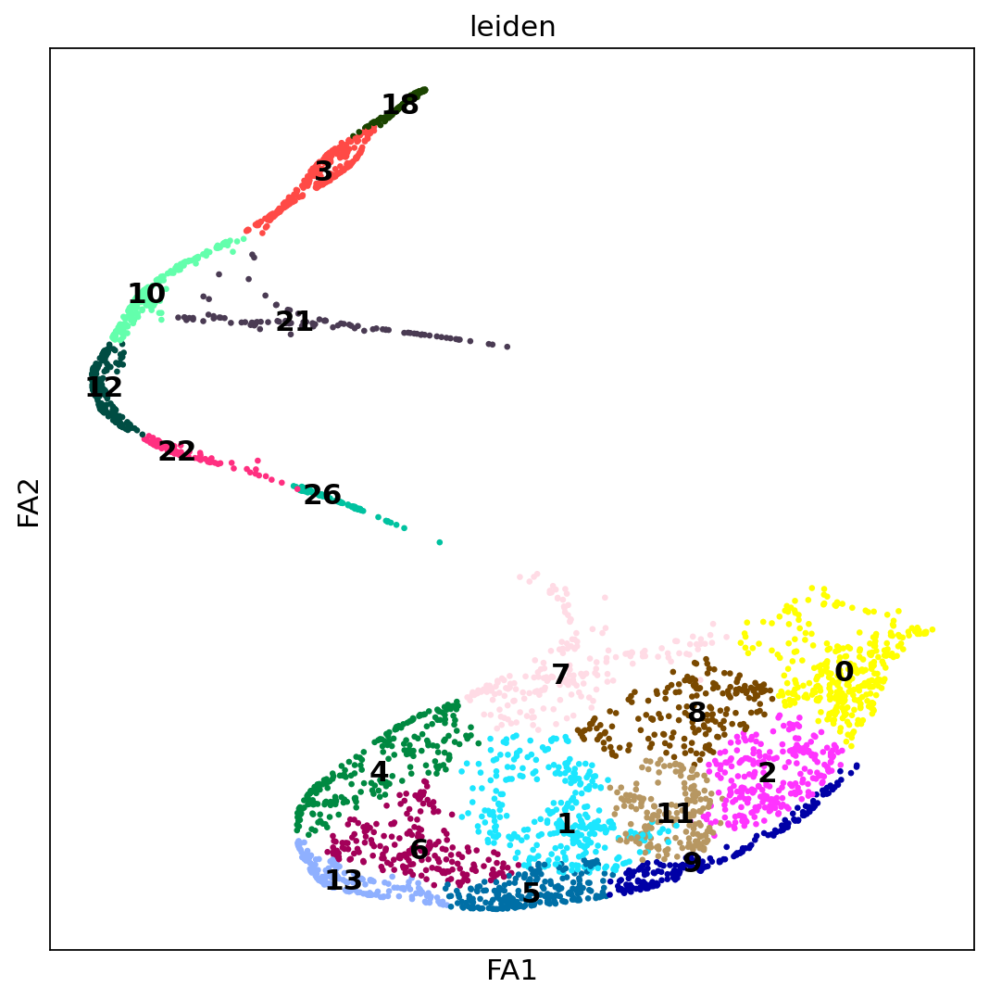

In [67]:
sc.set_figure_params(figsize = (8,8))
sc.pl.draw_graph(adataallsubset,color=["leiden"], legend_loc = 'on data')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:17)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


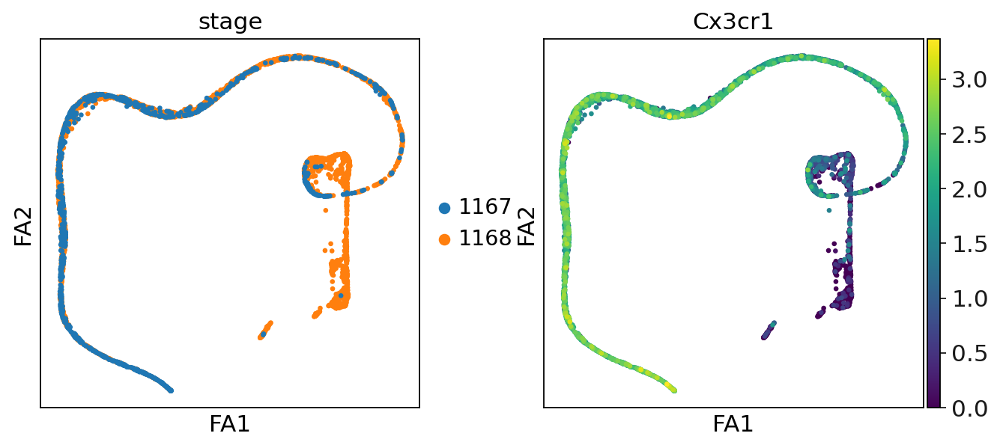

In [69]:
sc.pp.pca(adataallsubset)
pca_projections = pd.DataFrame(adataallsubset.obsm["X_pca"],index=adataallsubset.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
# generate neighbor draph in multiscale diffusion space
adataallsubset.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adataallsubset,n_neighbors=30,use_rep="X_palantir")

adataallsubset.obsm["X_pca2d"]=adataallsubset.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adataallsubset,init_pos='X_pca2d')
sc.tl.leiden(adataallsubset)
sc.set_figure_params()
sc.pl.draw_graph(adataallsubset,color=["stage",'Cx3cr1']) #PCA-based

In [75]:
sc.tl.umap(adataallsubset) #PCA-based

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


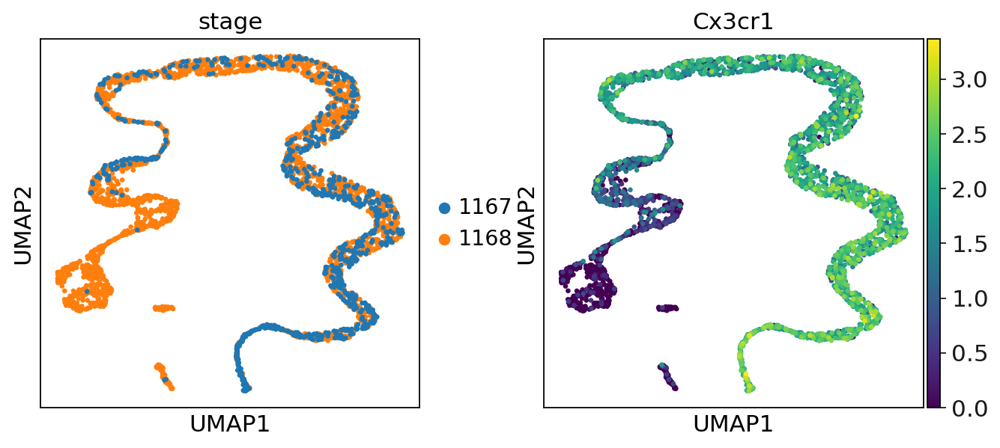

In [76]:
sc.pl.umap(adataallsubset,color=["stage",'Cx3cr1']) #PCA-based

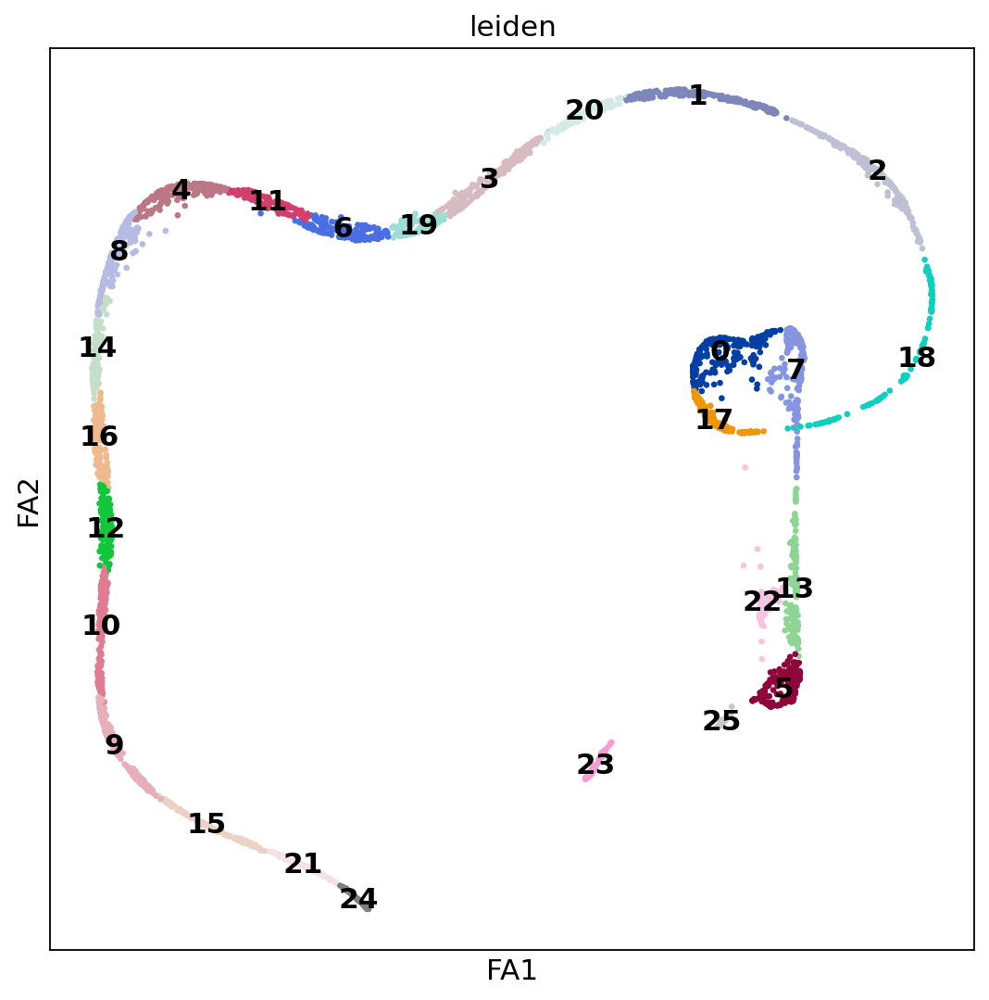

In [77]:
sc.set_figure_params(figsize = (8,8))
sc.pl.draw_graph(adataallsubset,color=["leiden"], legend_loc = 'on data')

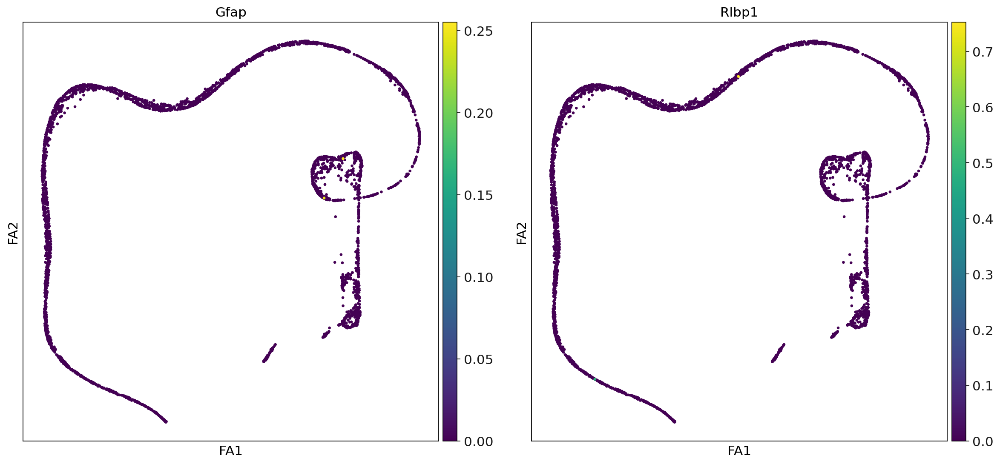

In [85]:
sc.set_figure_params(figsize = (8,8))
sc.pl.draw_graph(adataallsubset,color=["Gfap",'Rlbp1'], legend_loc = 'on data')

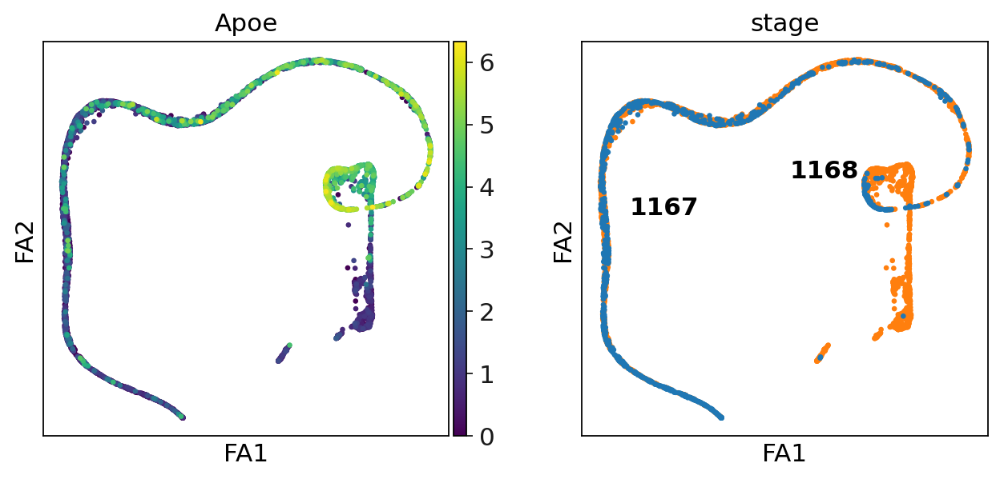

In [97]:
sc.set_figure_params()
sc.pl.draw_graph(adataallsubset,color=["Apoe",'stage'], legend_loc = 'on data')

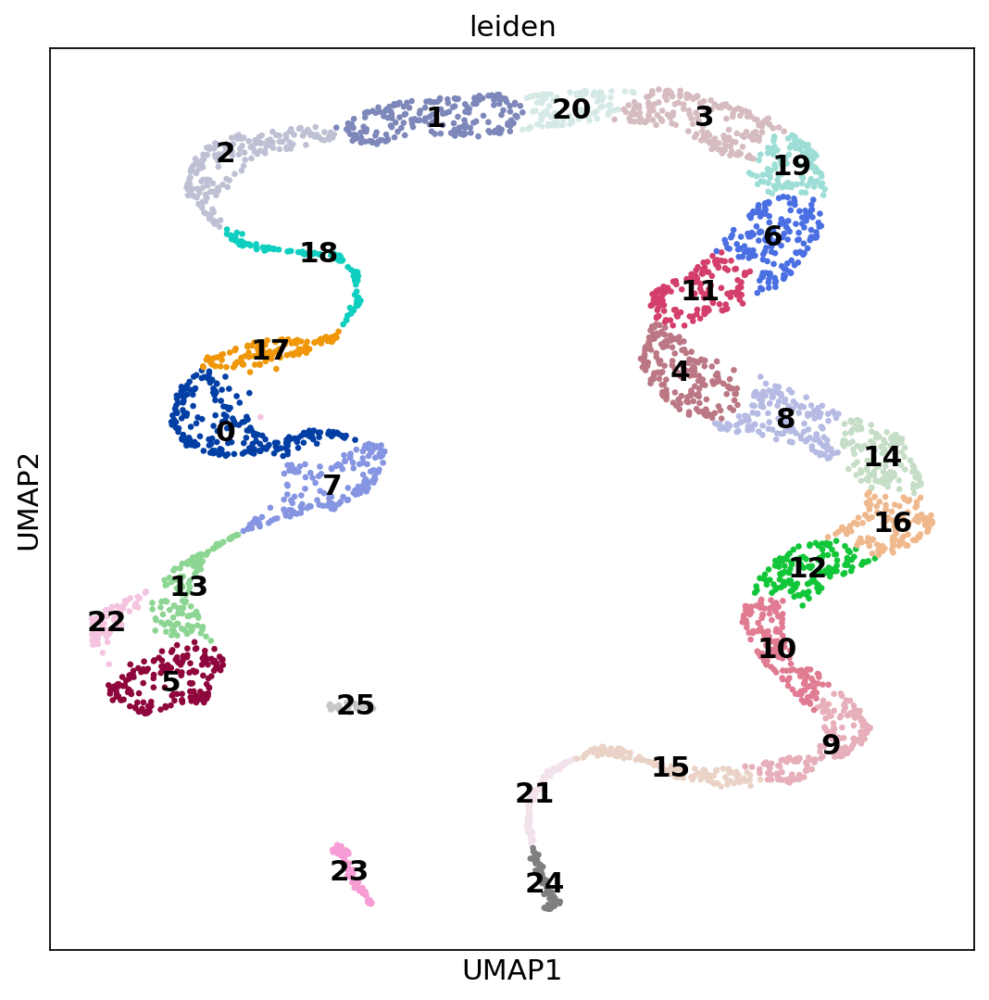

In [78]:
sc.set_figure_params(figsize = (8,8))
sc.pl.umap(adataallsubset,color=["leiden"], legend_loc = 'on data')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:43)


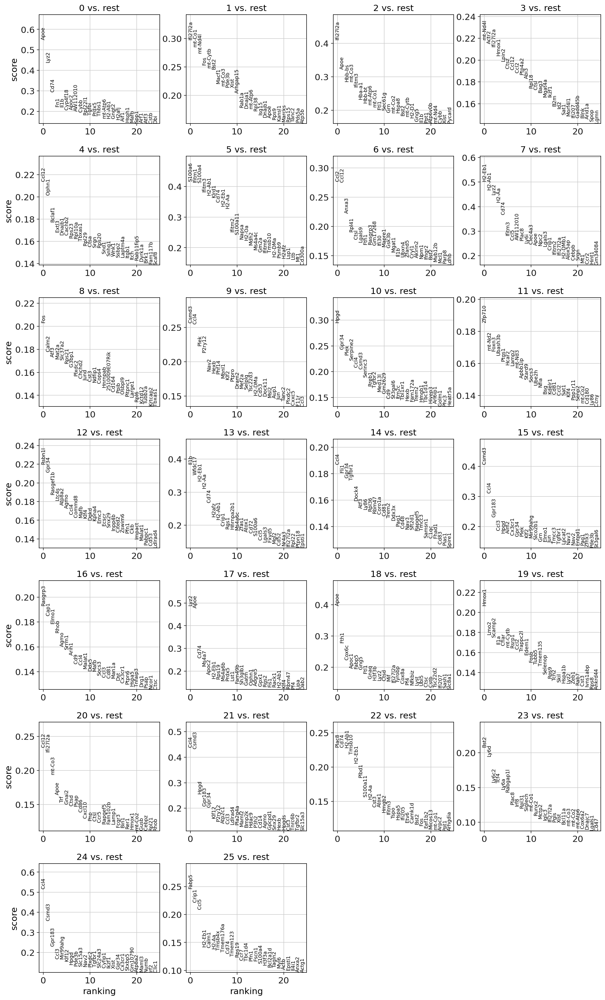

In [79]:
sc.set_figure_params()
sc.tl.rank_genes_groups(adataallsubset, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adataallsubset, n_genes=25, sharey=False)

In [98]:
adataallsubset = adataallsubset[adataallsubset.obs['leiden'].isin(['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','24'])]

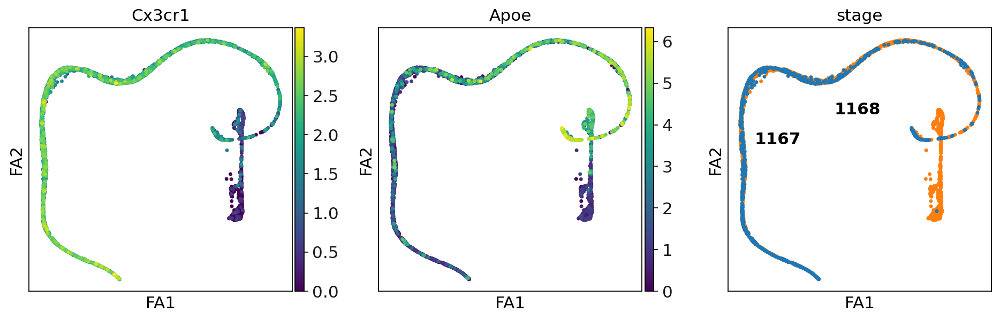

In [99]:
sc.set_figure_params()
sc.pl.draw_graph(adataallsubset,color=['Cx3cr1',"Apoe",'stage'], legend_loc = 'on data')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:15)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


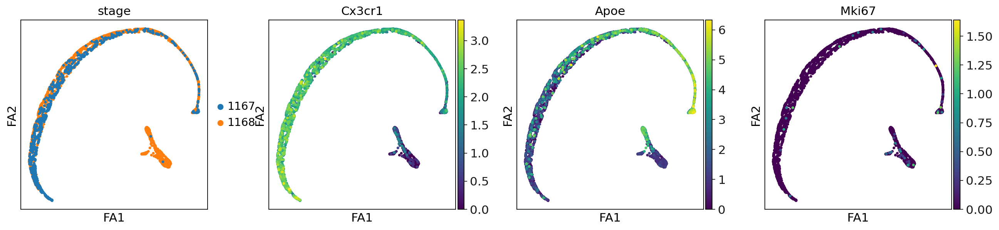

In [101]:
sc.pp.pca(adataallsubset)
pca_projections = pd.DataFrame(adataallsubset.obsm["X_pca"],index=adataallsubset.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
# generate neighbor draph in multiscale diffusion space
adataallsubset.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adataallsubset,n_neighbors=30,use_rep="X_palantir")

adataallsubset.obsm["X_pca2d"]=adataallsubset.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adataallsubset,init_pos='X_pca2d')
sc.tl.leiden(adataallsubset)
sc.set_figure_params()
sc.pl.draw_graph(adataallsubset,color=["stage",'Cx3cr1','Apoe','Mki67']) #PCA-based

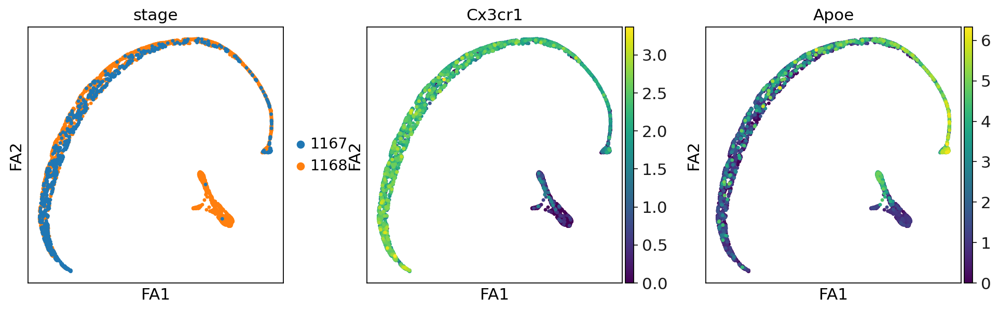

In [102]:
sc.pl.draw_graph(adataallsubset,color=["stage",'Cx3cr1','Apoe']) #PCA-based

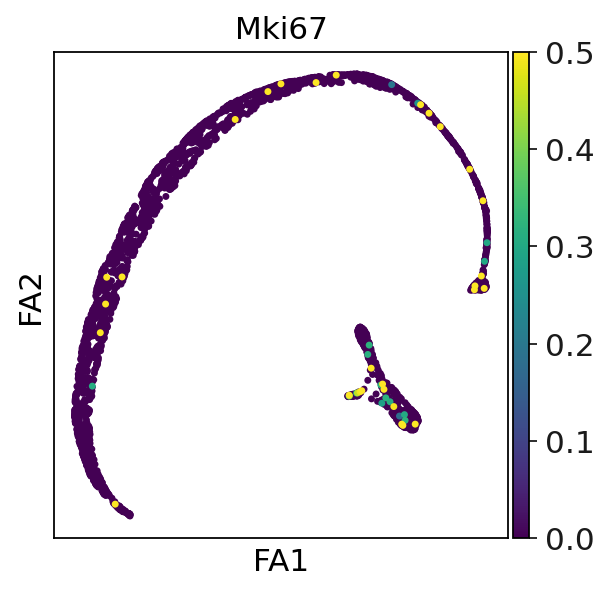

In [104]:
sc.pl.draw_graph(adataallsubset,color=["Mki67"], vmax = 0.5) #PCA-based

In [105]:
sc.tl.score_genes(adataallsubset, gene_list = ['Cxcl10','Stat1','Ifit1'], score_name = 'IFN-response')

computing score 'IFN-response'
    finished: added
    'IFN-response', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)


In [106]:
sc.tl.score_genes(adataallsubset, gene_list = ['Apoe','Igf1','H2-Aa','Cd74'], score_name = 'Inflammatory')

computing score 'Inflammatory'
    finished: added
    'Inflammatory', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)


In [110]:
sc.tl.score_genes(adataallsubset, gene_list = ['Mki67','Cdc20'], score_name = 'Proliferating')

computing score 'Proliferating'
    finished: added
    'Proliferating', score of gene set (adata.obs).
    99 total control genes are used. (0:00:00)


In [107]:
sc.tl.score_genes(adataallsubset, gene_list = ['P2ry12', 'Ccr5', 'Cd33', 'Csf1r', 'Cx3cr1', 'Glul', 'Gpr34', 'Adgrg1', 'Tgfb1', 'Tgfbr1', 'Serinc3', 'Siglech', 'Mertk', 'Bin1', 'Tmem119', 'Spi1', 'Sall1', 'Mafb', 'Smad3', 'Mef2a', 'Egr1', 'Jun'], score_name = 'Homeostatic')

computing score 'Homeostatic'
    finished: added
    'Homeostatic', score of gene set (adata.obs).
    148 total control genes are used. (0:00:00)


In [108]:
sc.tl.score_genes(adataallsubset, gene_list = ['Apoe', 'Axl', 'Clec7a', 'Csf1', 'Cst7', 'Ctsb', 'Ctsd', 'Cybb', 'Fabp5', 'Fth1', 'Gnas', 'Gpnmb', 'Grn', 'Il1b', 'Lgals3', 'Lilrb4a', 'Lpl', 'Lyz2', 'Msr1', 'Spp1', 'Trem2', 'Tyrobp', 'Vegfa', 'H2-Ab1'], score_name = 'Proinflammatory')

computing score 'Proinflammatory'
    finished: added
    'Proinflammatory', score of gene set (adata.obs).
    449 total control genes are used. (0:00:00)


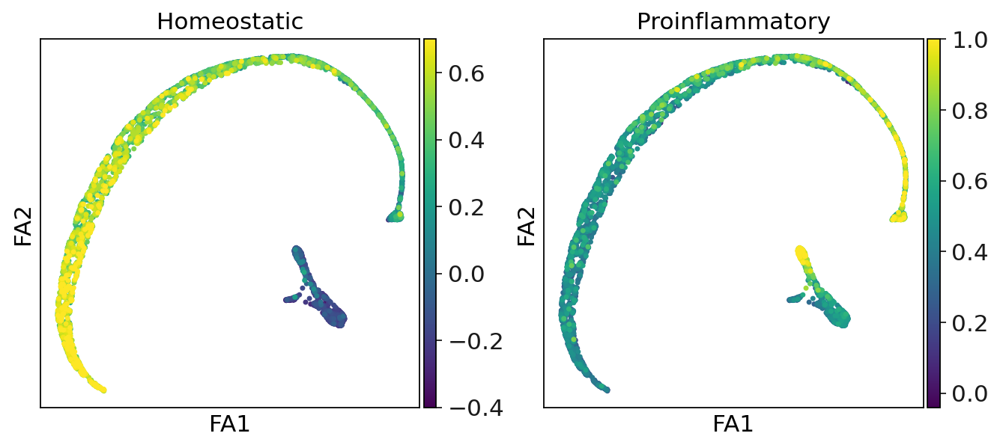

In [113]:
sc.pl.draw_graph(adataallsubset,color=['Homeostatic','Proinflammatory'], vmax = [0.7,1])

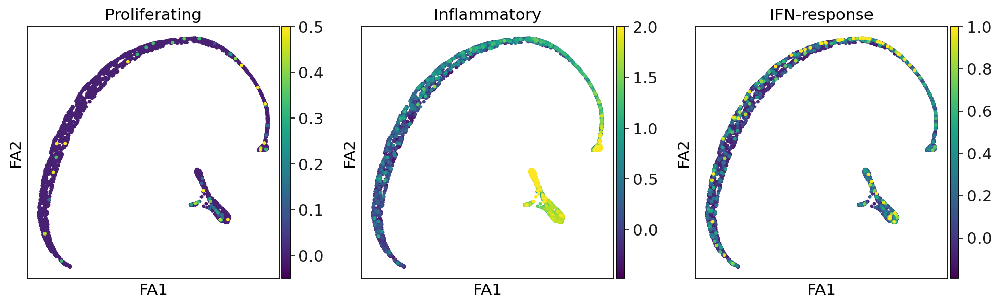

In [115]:
sc.pl.draw_graph(adataallsubset,color=['Proliferating','Inflammatory','IFN-response'], vmax = [0.5,2,1])

In [117]:
sc.tl.leiden(adataallsubset)

running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [118]:
AnnData.write_h5ad(adataallsubset, "/mnt/c/Users/Emil/10X/microglia_glaucoma.h5ad")

In [126]:
adataSeurat = adataallsubset


In [130]:
adataSeurat.raw = adataSeurat

In [131]:
adataSeurat

AnnData object with n_obs × n_vars = 3075 × 18328
    obs: 'stage', 'batch', 'leiden', 'IFN-response', 'Inflammatory', 'Homeostatic', 'Proinflammatory', 'Proliferating'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'leiden', 'stage_colors', 'leiden_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [132]:
adataSeurat.raw

In [133]:
t=adataSeurat.raw.X.toarray()
pd.DataFrame(data=t, index=adataSeurat.obs_names, columns=adataSeurat.raw.var_names).to_csv('/mnt/c/Users/Emil/10X/microglia_glaucomaraw-counts.csv')
# comma separated csv with header, no rownames
pd.DataFrame(adataSeurat.obs).to_csv("/mnt/c/Users/Emil/10X/microglia_glaucomametadata.csv")

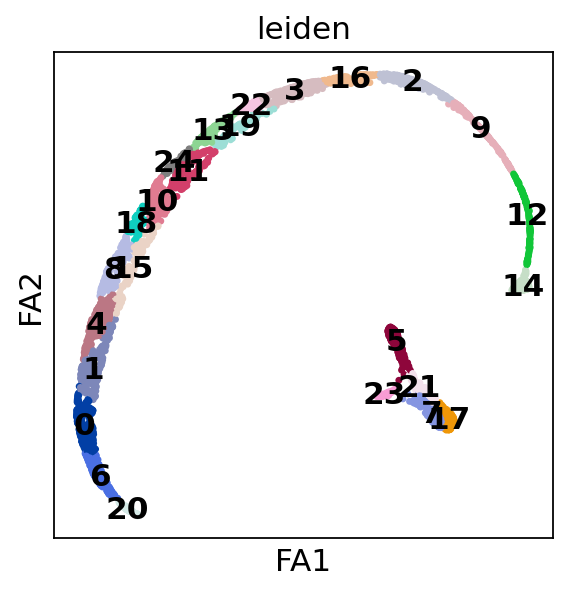

In [135]:
sc.pl.draw_graph(adataallsubset,color=['leiden'], legend_loc = 'on data')

In [140]:
old_to_new = {
'5':'Inflammatory',
'14':'Inflammatory',
'12':'Inflammatory',
'21':'Inflammatory',
'7':'Inflammatory',
'23':'Proliferating',
'17':'IFN-response',
'9':'IFN-response',
'2':'IFN-response',
'16':'IFN-response',
'3':'Resident',
'22':'Resident',
'19':'Resident',
'13':'Resident',
'24':'Resident',
'11':'Resident',
'10':'Resident',
'18':'Resident',
'8':'Resident',
'15':'Resident',
'1':'Resident',
'4':'Resident',
'0':'Resident',
'6':'Resident',
'20':'Resident'}
adataallsubset.obs['annotation'] = (
adataallsubset.obs['leiden']
.map(old_to_new).astype('category')
)


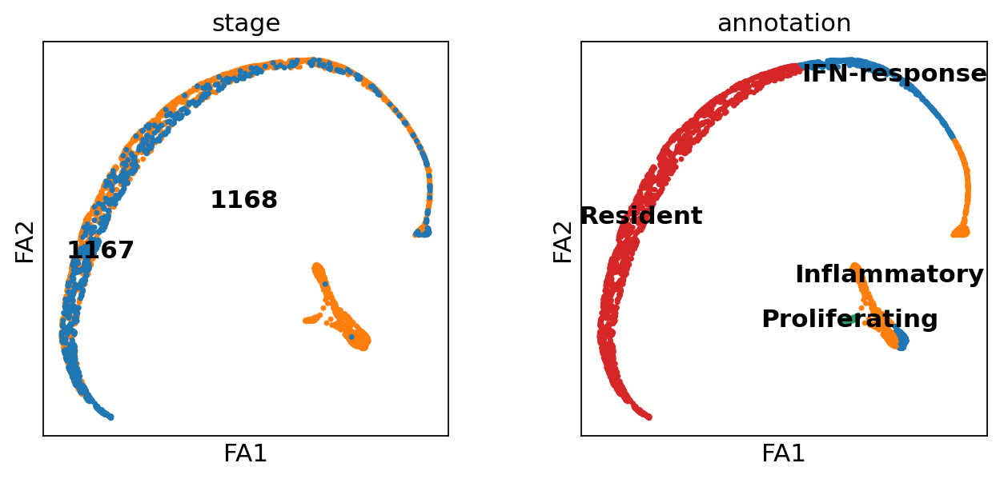

In [141]:
sc.pl.draw_graph(adataallsubset,color=['stage','annotation'], legend_loc = 'on data')

In [153]:
adataallsubset_1167 = adataallsubset[adataallsubset.obs['stage'].isin(['1167'])]

In [155]:
adataallsubset_1167.obs

,stage,batch,leiden,IFN-response,Inflammatory,Homeostatic,Proinflammatory,Proliferating,annotation
AAACCCATCACTGGGC-1-1,1167,1,15,-0.113926,-0.373514,0.687769,0.403877,-0.008282,Resident
AAACGAACAACTGCTA-1-1,1167,1,20,-0.110475,-0.293532,0.565629,0.200354,-0.013289,Resident
AAAGAACTCTTTGCTA-1-1,1167,1,3,-0.070971,1.268810,0.286392,1.003021,-0.020833,Resident
AAAGGATAGGCATGGT-1-1,1167,1,6,0.219984,-0.336143,0.762973,0.289852,-0.005838,Resident
AAAGGGCCAGGTCAGA-1-1,1167,1,10,-0.122983,-0.174122,0.411781,0.481920,-0.014139,Resident
...,...,...,...,...,...,...,...,...,...
TTTATGCAGCTGTTCA-1-1,1167,1,19,-0.091596,-0.428018,0.544727,0.454173,-0.008551,Resident
TTTCAGTGTCATCCCT-1-1,1167,1,20,0.077322,-0.244579,0.674223,0.342366,-0.013812,Resident
TTTCATGCAACCCGCA-1-1,1167,1,24,0.512783,0.341206,0.510160,0.601231,-0.009611,Resident
TTTCATGGTACTAAGA-1-1,1167,1,11,0.093101,-0.385735,0.726995,0.354685,-0.008224,Resident


In [154]:
adataallsubset_1168 = adataallsubset[adataallsubset.obs['stage'].isin(['1168'])]

In [157]:
adataallsubset_1167.obs.annotation.value_counts()

Resident        698
Inflammatory     72
IFN-response     54
Name: annotation, dtype: int64

In [158]:
adataallsubset_1168.obs.annotation.value_counts()

Resident         1174
Inflammatory      542
IFN-response      477
Proliferating      58
Name: annotation, dtype: int64

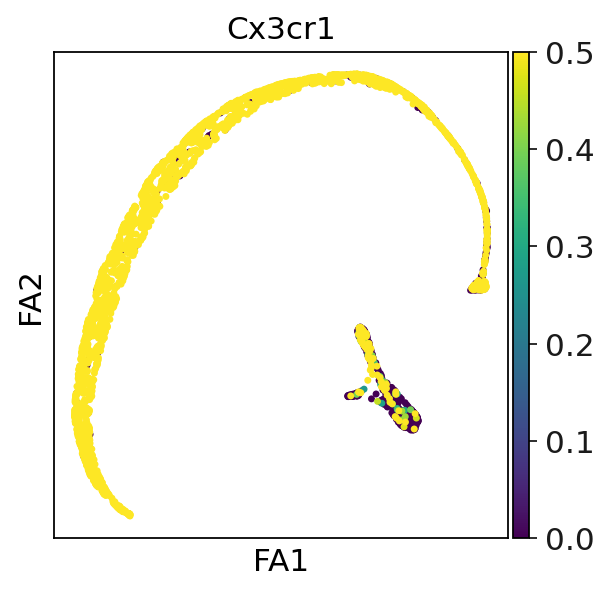

In [160]:
sc.pl.draw_graph(adataallsubset,color=['Cx3cr1'], vmax = 0.5)

In [162]:
import scvelo as scv

In [167]:
loom67 = scv.read("/mnt/c/Users/Emil/10X/D23-1167.loom", cache = True)

... writing an h5ad cache file to speedup reading next time


In [168]:
loom68 = scv.read("/mnt/c/Users/Emil/10X/D23-1168.loom", cache = True)

... writing an h5ad cache file to speedup reading next time


In [169]:
adataallsubset_1167 = scv.utils.merge(adataallsubset_1167, loom67)

In [170]:
adataallsubset_1168

View of AnnData object with n_obs × n_vars = 2251 × 18328
    obs: 'stage', 'batch', 'leiden', 'IFN-response', 'Inflammatory', 'Homeostatic', 'Proinflammatory', 'Proliferating', 'annotation'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'leiden', 'stage_colors', 'leiden_colors', 'rank_genes_groups', 'umap', 'annotation_colors'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [171]:
adataallsubset_1168 = scv.utils.merge(adataallsubset_1168, loom68)

In [172]:
adataallsubset_1168

AnnData object with n_obs × n_vars = 2251 × 18076
    obs: 'stage', 'batch', 'leiden', 'IFN-response', 'Inflammatory', 'Homeostatic', 'Proinflammatory', 'Proliferating', 'annotation', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'draw_graph', 'leiden', 'stage_colors', 'leiden_colors', 'rank_genes_groups', 'umap', 'annotation_colors'
    obsm: 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

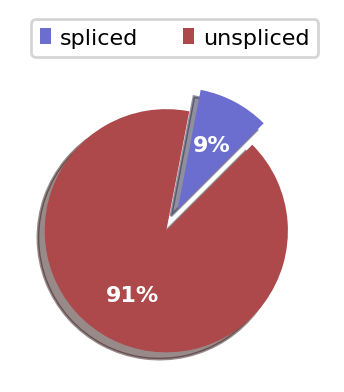

In [173]:
scv.pl.proportions(adataallsubset_1167)

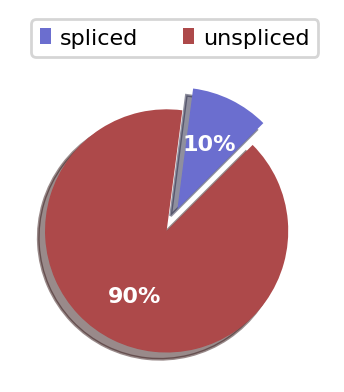

In [174]:
scv.pl.proportions(adataallsubset_1168)

In [175]:
scv.pp.filter_and_normalize(adataallsubset_1167, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adataallsubset_1167, n_pcs=30, n_neighbors=30)

Filtered out 17809 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [176]:
scv.pp.filter_and_normalize(adataallsubset_1168, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adataallsubset_1168, n_pcs=30, n_neighbors=30)

Filtered out 17761 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [177]:
scv.tl.velocity(adataallsubset_1167)
scv.tl.velocity(adataallsubset_1168)

computing velocities
The correlation threshold has been reduced to -0.5392.
Please be cautious when interpreting results.
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [179]:
scv.pp.neighbors(adataallsubset_1167)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [180]:
scv.tl.velocity_graph(adataallsubset_1167)

computing velocity graph (using 1/12 cores)


  0%|          | 0/824 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [181]:
scv.pp.neighbors(adataallsubset_1168)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [182]:
scv.tl.velocity_graph(adataallsubset_1168)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2251 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


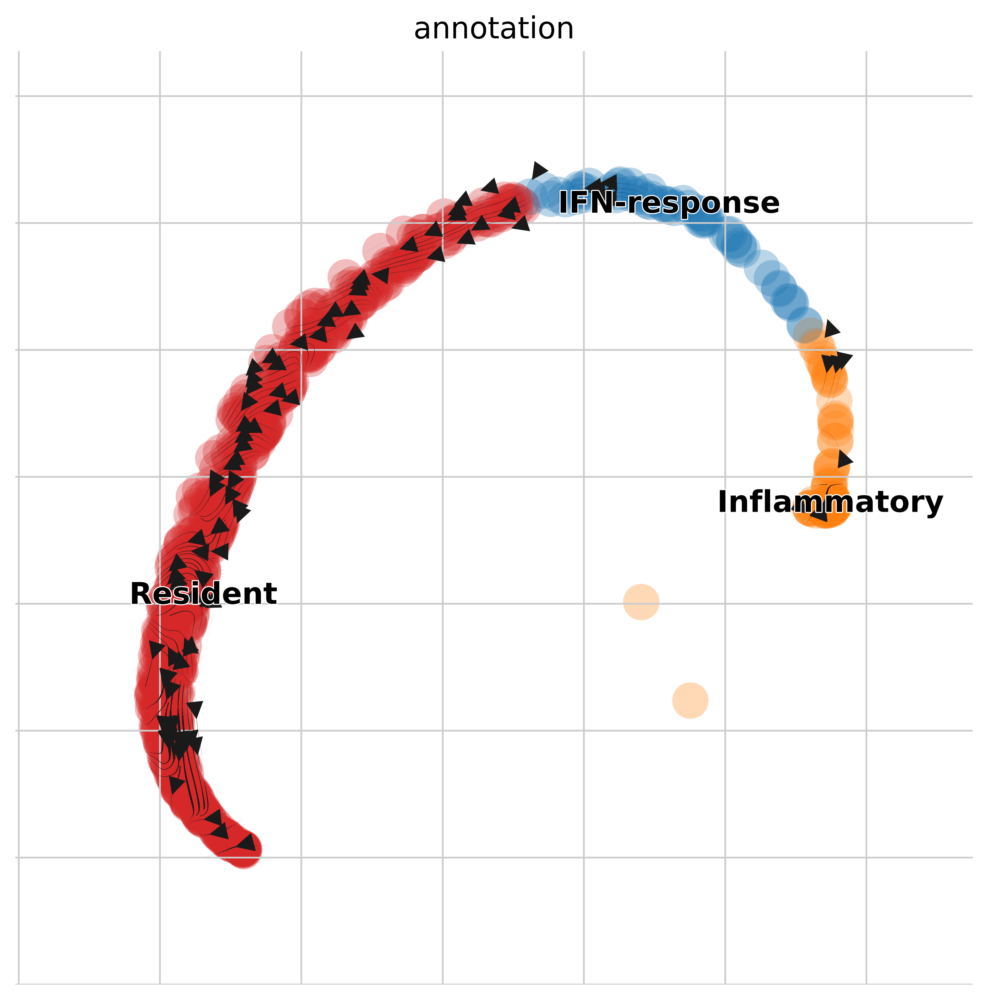

In [184]:
scv.pl.velocity_embedding_stream(adataallsubset_1167, basis='draw_graph_fa', color = 'annotation', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


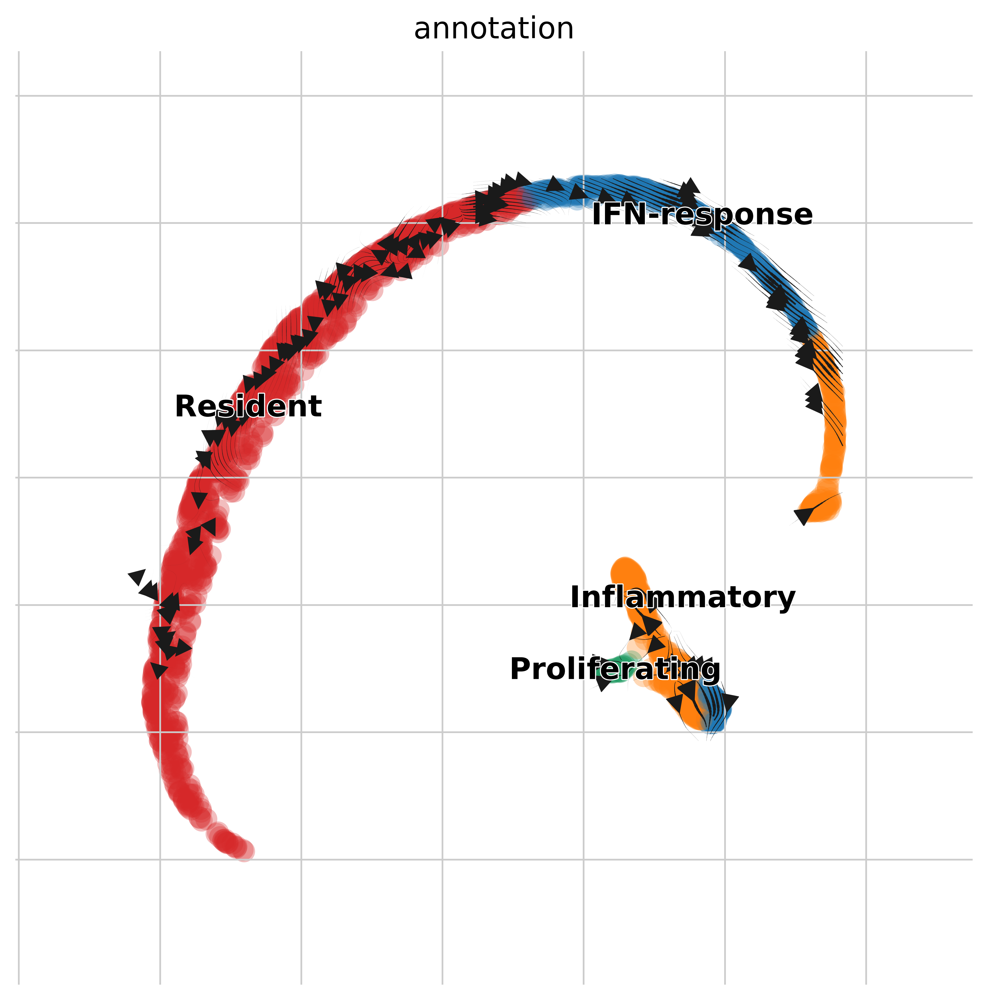

In [185]:
scv.pl.velocity_embedding_stream(adataallsubset_1168, basis='draw_graph_fa', color = 'annotation', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

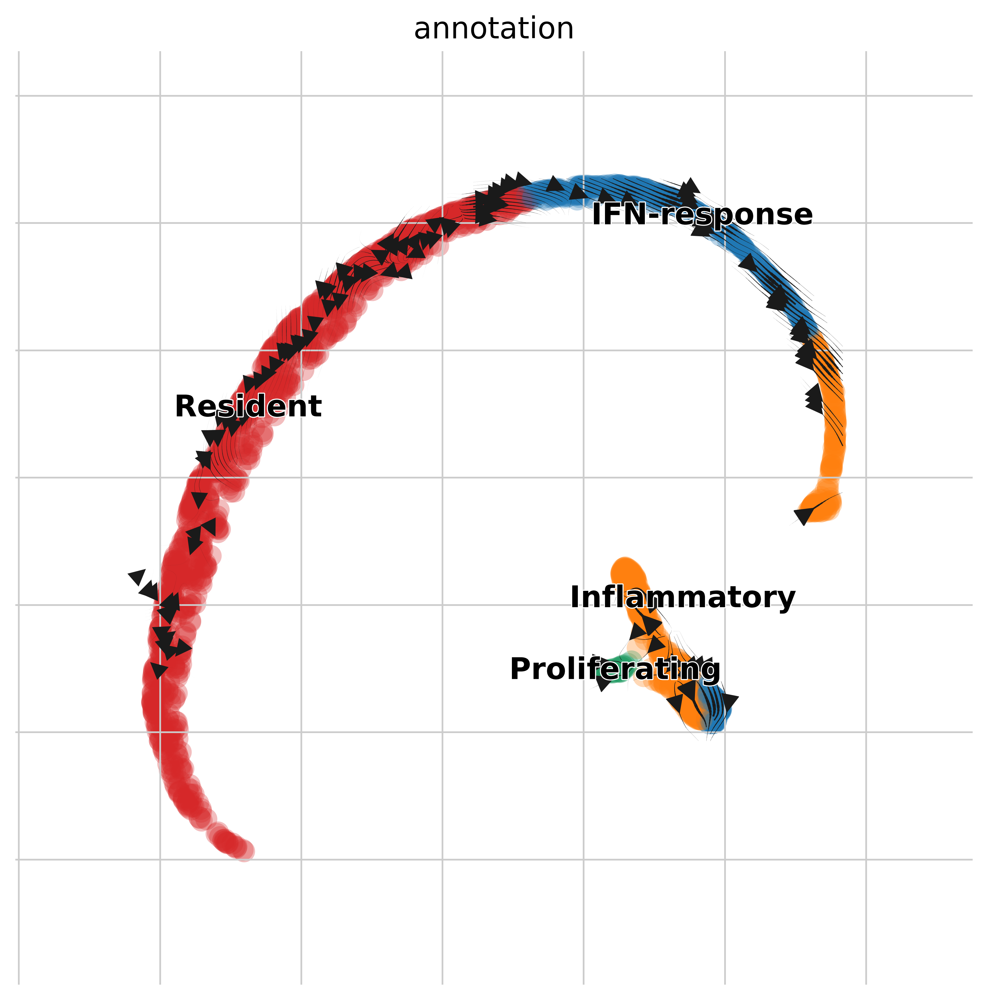

In [202]:
scv.pl.velocity_embedding_stream(adataallsubset_1168, basis='draw_graph_fa', color = 'annotation', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

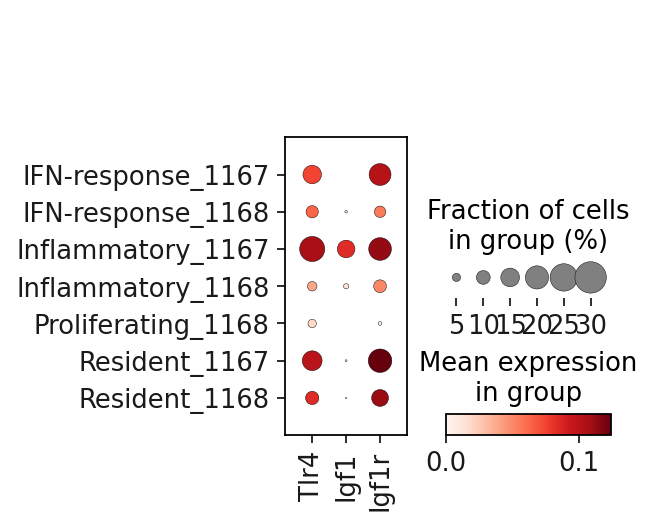

In [203]:
sc.pl.dotplot(adataallsubset, var_names = ['Tlr4','Igf1','Igf1r'], groupby = ['annotation','stage'])

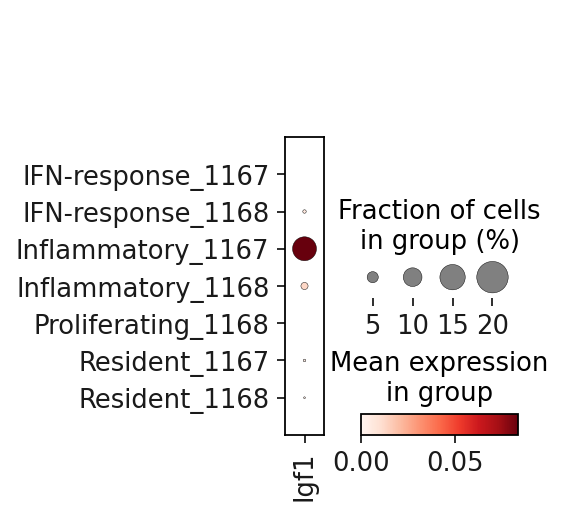

In [193]:
sc.pl.dotplot(adataallsubset, var_names = ['Igf1'], groupby = ['annotation','stage'])

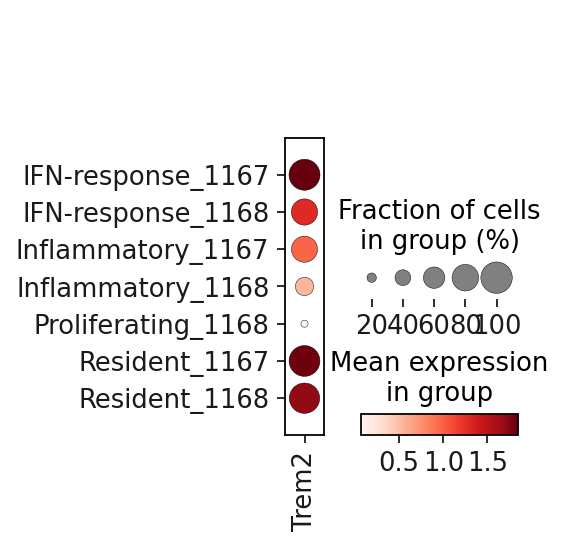

In [194]:
sc.pl.dotplot(adataallsubset, var_names = ['Trem2'], groupby = ['annotation','stage'])

In [188]:
adataallsubset.obs

,stage,batch,leiden,IFN-response,Inflammatory,Homeostatic,Proinflammatory,Proliferating,annotation
AAACCCACAAGGCTTT-1-0,1168,0,18,-0.048693,0.094934,0.369028,0.363739,-0.008198,Resident
AAACGAAAGCCTTTGA-1-0,1168,0,9,-0.088328,0.440758,0.140660,0.839160,0.000000,IFN-response
AAACGAAAGTAACCTC-1-0,1168,0,10,-0.097547,-0.151384,0.640222,0.211870,0.000000,Resident
AAACGCTAGACAACAT-1-0,1168,0,3,-0.099895,0.597148,0.203096,0.722552,-0.006218,Resident
AAACGCTCAAGACCTT-1-0,1168,0,21,-0.101565,1.354016,-0.166236,0.427236,0.382382,Inflammatory
...,...,...,...,...,...,...,...,...,...
TTTATGCAGCTGTTCA-1-1,1167,1,19,-0.091596,-0.428018,0.544727,0.454173,-0.008551,Resident
TTTCAGTGTCATCCCT-1-1,1167,1,20,0.077322,-0.244579,0.674223,0.342366,-0.013812,Resident
TTTCATGCAACCCGCA-1-1,1167,1,24,0.512783,0.341206,0.510160,0.601231,-0.009611,Resident
TTTCATGGTACTAAGA-1-1,1167,1,11,0.093101,-0.385735,0.726995,0.354685,-0.008224,Resident


In [204]:
AnnData.write_h5ad(adataallsubset_1168, "/mnt/c/Users/Emil/10X/adataallsubset_1168.h5ad")

In [205]:
AnnData.write_h5ad(adataallsubset_1167, "/mnt/c/Users/Emil/10X/adataallsubset_1167.h5ad")

saving figure to file figures/glaucoma1167.svg


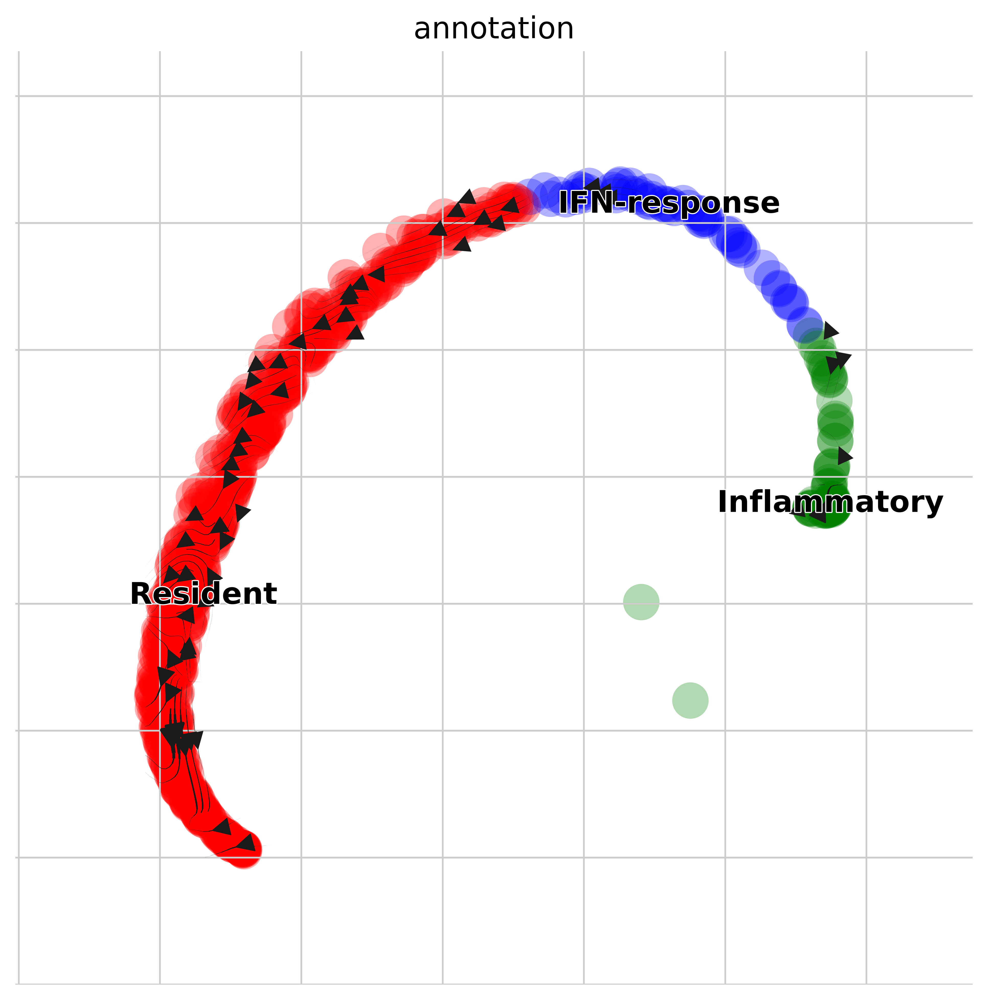

In [223]:
scv.pl.velocity_embedding_stream(adataallsubset_1167, basis='draw_graph_fa', color = 'annotation', palette = ['blue','green','red'], dpi = 300, density = 4, add_margin=0.2, figsize = (8,8), arrow_size = 2,save="figures/glaucoma1167.svg")

saving figure to file figures/glaucoma1168.svg


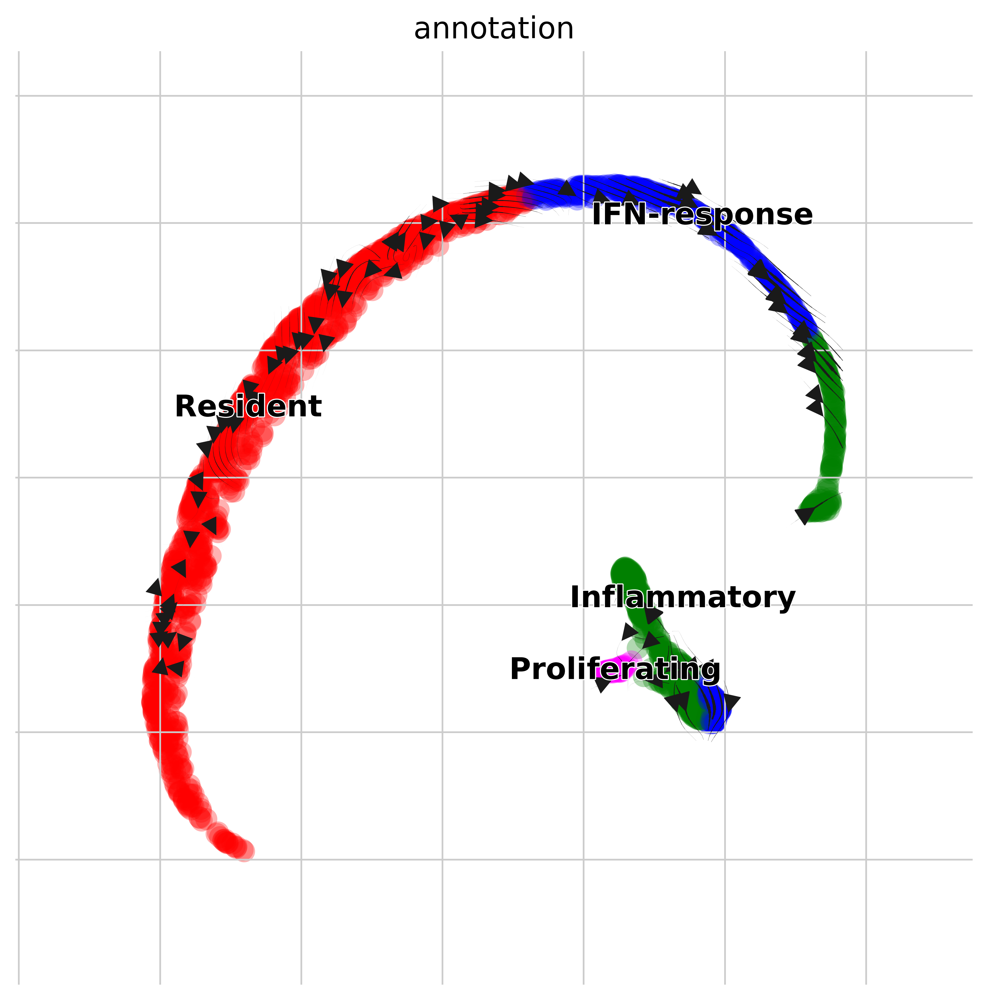

In [224]:
scv.pl.velocity_embedding_stream(adataallsubset_1168, basis='draw_graph_fa', color = 'annotation', palette = ['blue','green','magenta','red'], dpi = 300, density = 4, add_margin=0.2, figsize = (8,8), arrow_size = 2,save="figures/glaucoma1168.svg")

saving figure to file figures/glaucoma1167_gray.svg


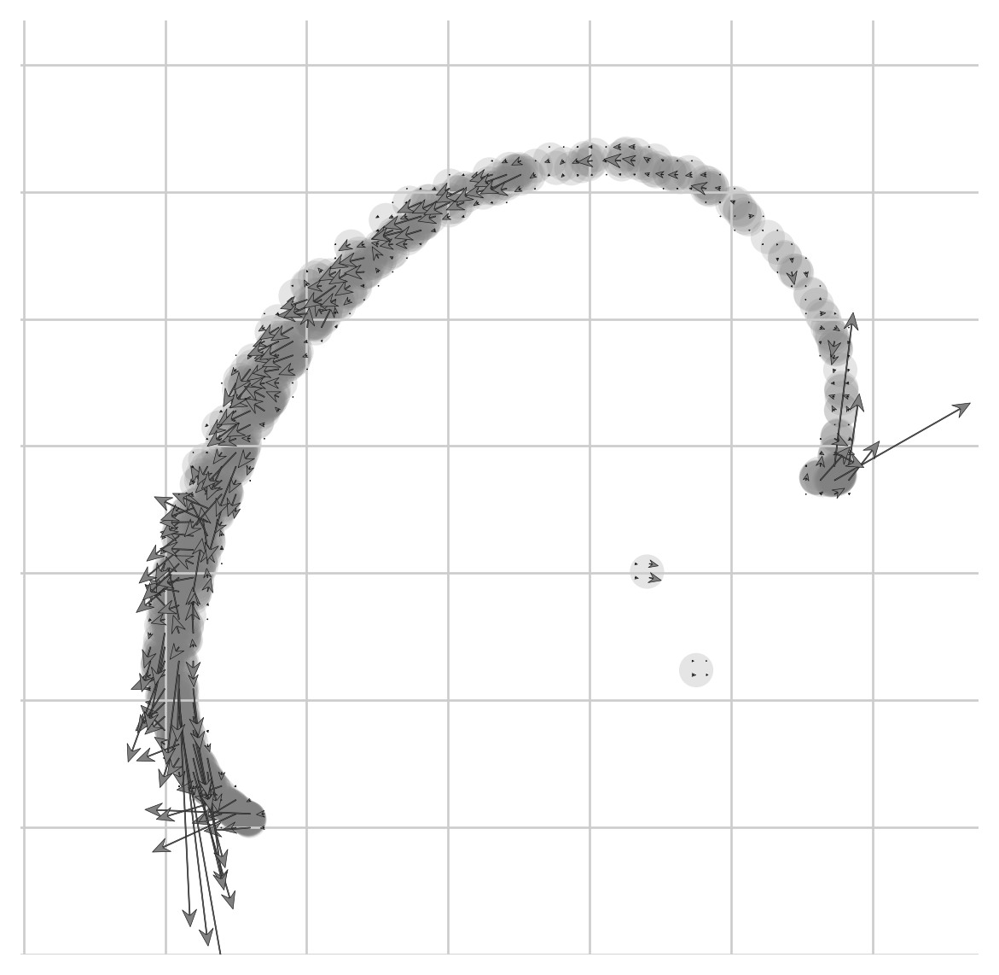

In [225]:
scv.pl.velocity_embedding_grid(adataallsubset_1167, basis='draw_graph_fa', arrow_length = 5, arrow_size = 3, dpi=120, figsize = (6,6), add_margin = 0.2,save="figures/glaucoma1167_gray.svg")

saving figure to file figures/glaucoma1168_gray.svg


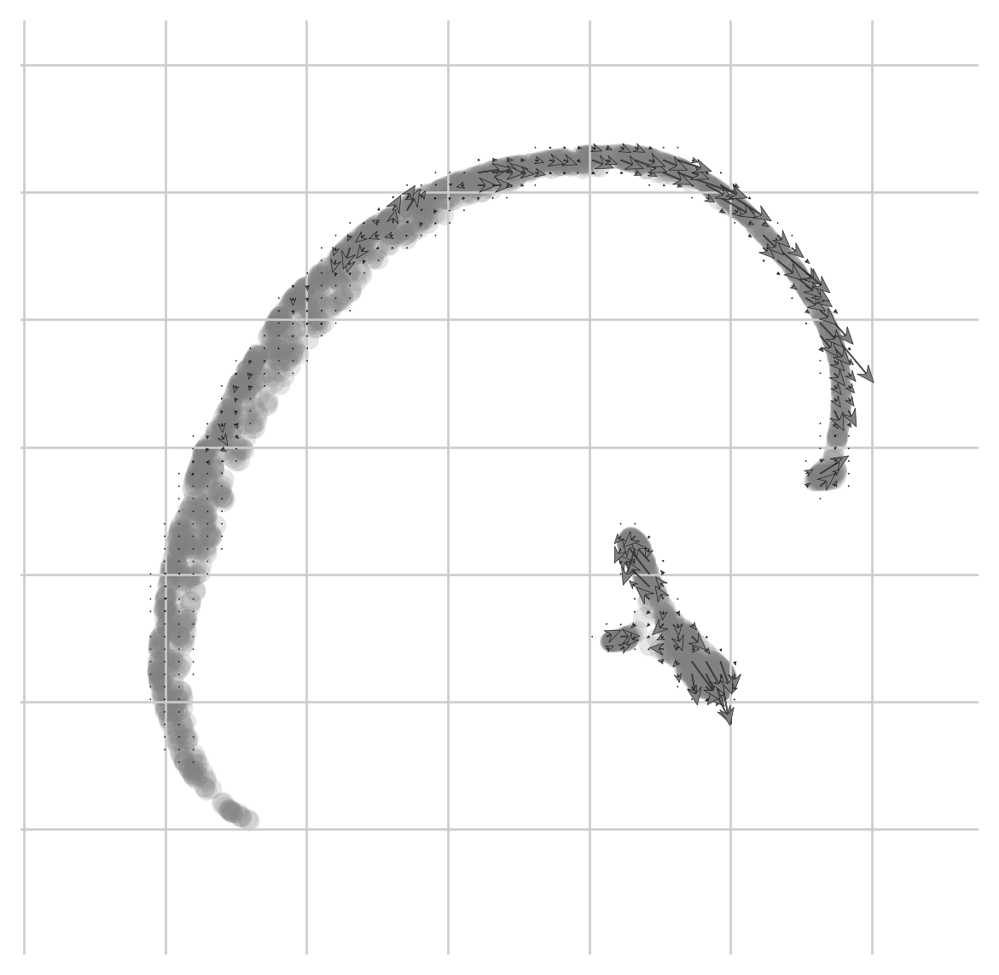

In [226]:
scv.pl.velocity_embedding_grid(adataallsubset_1168, basis='draw_graph_fa', arrow_length = 2, arrow_size = 3, dpi=120, figsize = (6,6), add_margin = 0.2,save="figures/glaucoma1168_gray.svg")

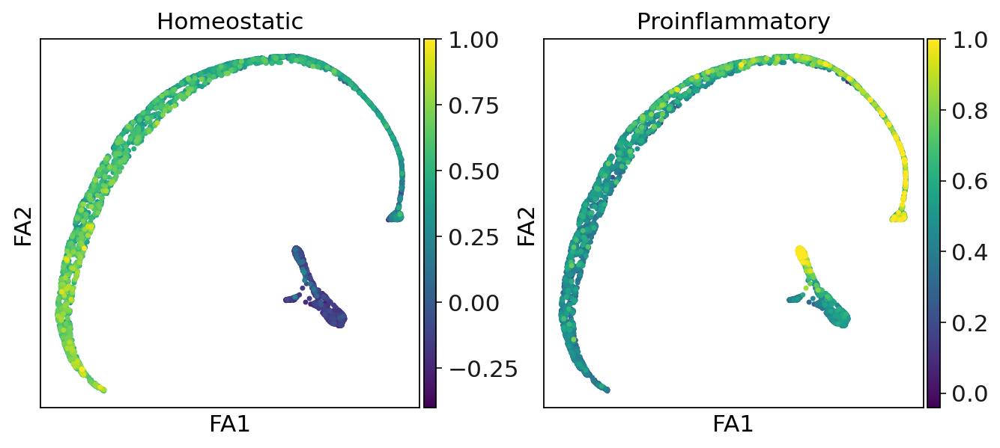

In [232]:
sc.pl.draw_graph(adataallsubset,color=['Homeostatic','Proinflammatory'], vmax = [1,1], save = 'glaucoma_patterns_1.pdf')

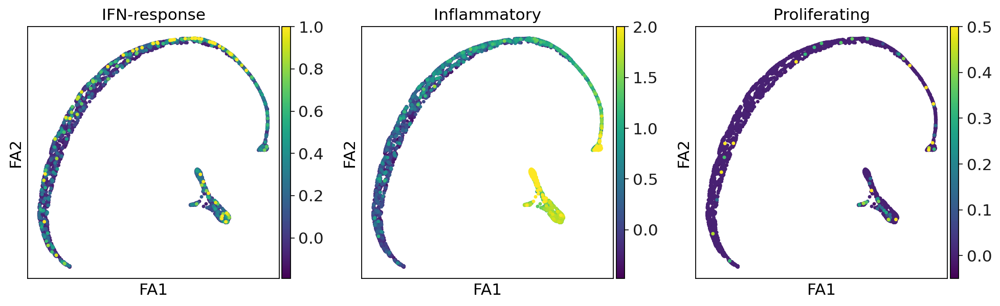

In [233]:
sc.pl.draw_graph(adataallsubset,color=['IFN-response','Inflammatory','Proliferating'], vmax = [1,2,0.5], save = 'glaucoma_patterns_2.pdf')

In [234]:
WT = sc.read_h5ad('/mnt/c/Users/Emil/10X/microglia_WTKO_basic_and_velocity_WT.h5ad')

In [235]:
KO = sc.read_h5ad('/mnt/c/Users/Emil/10X/microglia_WTKO_basic_and_velocity_KO.h5ad')

In [240]:
microgliaChen = sc.read_h5ad("/mnt/c/Users/Emil/10X/microglia.h5ad")

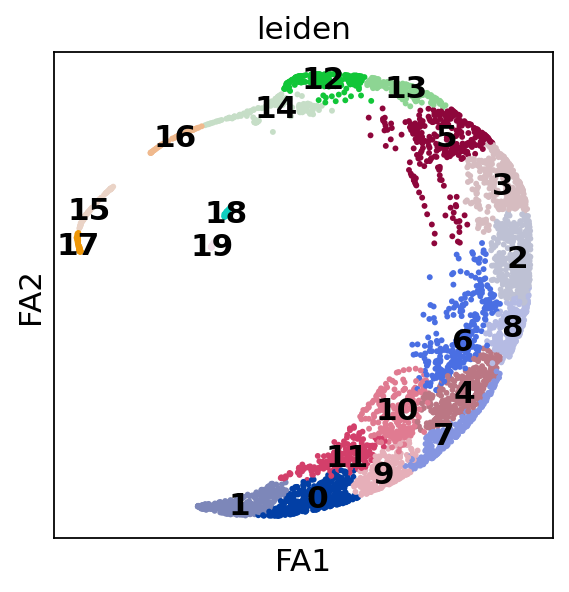

In [244]:
sc.pl.draw_graph(microgliaChen,color=['leiden'], legend_loc = 'on data')

In [245]:
microgliaChen = microgliaChen[microgliaChen.obs['leiden'].isin(['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17'])]

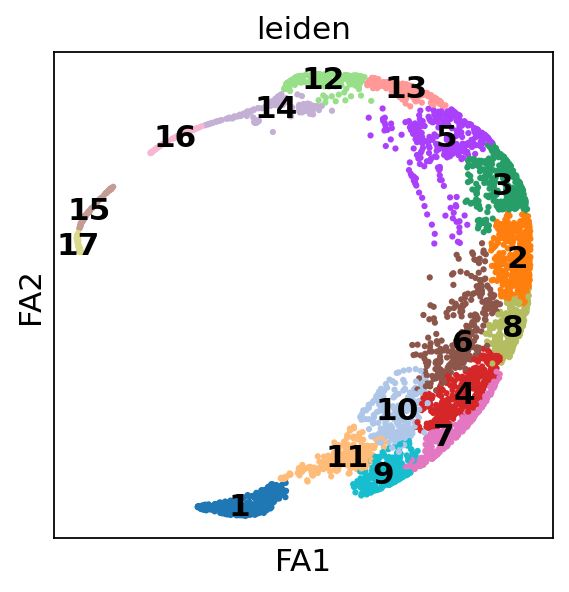

In [246]:
sc.pl.draw_graph(microgliaChen,color=['leiden'], legend_loc = 'on data')

In [247]:
adatasummary = AnnData.concatenate(adataallsubset, microgliaChen)

In [248]:
adatasummary

AnnData object with n_obs × n_vars = 6887 × 15042
    obs: 'stage', 'batch', 'leiden', 'IFN-response', 'Inflammatory', 'Homeostatic', 'Proinflammatory', 'Proliferating', 'annotation', 't', 'seg', 'edge', 't_sd', 'milestones'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    obsm: 'X_draw_graph_fa', 'X_palantir', 'X_pca', 'X_pca2d', 'X_umap'

In [249]:
adatasummary.obs.stage.value_counts()

WT      2280
1168    2251
KO      1532
1167     824
Name: stage, dtype: int64

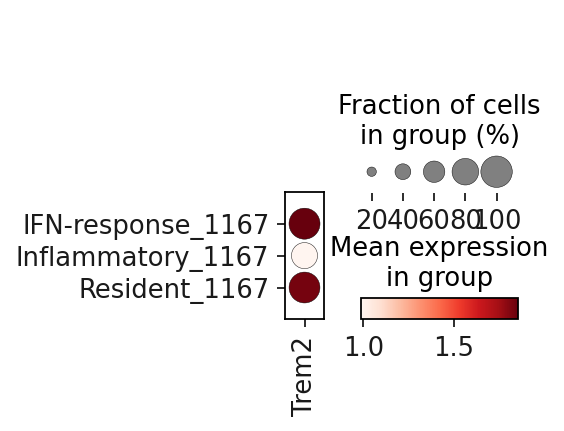

In [251]:
sc.pl.dotplot(adataallsubset_1167, var_names = ['Trem2'], groupby = ['annotation','stage'])

In [261]:
adatasummary.raw = adatasummary

In [263]:
t=adatasummary.raw.X.toarray()
pd.DataFrame(data=t, index=adatasummary.obs_names, columns=adatasummary.raw.var_names).to_csv('/mnt/c/Users/Emil/10X/11raw-counts.csv')
# comma separated csv with header, no rownames
pd.DataFrame(adatasummary.obs).to_csv("/mnt/c/Users/Emil/10X/11metadata.csv")